<a href="https://colab.research.google.com/github/ANKVIT26/ANKVIT26/blob/main/Copy_of_CarTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libarchive-dev libleptonica-dev tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  libarchive-dev libleptonica-dev libtesseract-dev tesseract-ocr tesseract-ocr-eng
  tesseract-ocr-osd
0 upgraded, 6 newly installed, 0 to remove and 49 not upgraded.
Need to get 8,560 kB of archives.
After this operation, 31.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libarchive-dev amd64 3.6.0-1ubuntu1.3 [581 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libleptonica-dev amd64 1.82.0-3build1 [1,562 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libtesseract-dev amd64 4.1.1-2.1build1 [1,600 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:5 http://arc

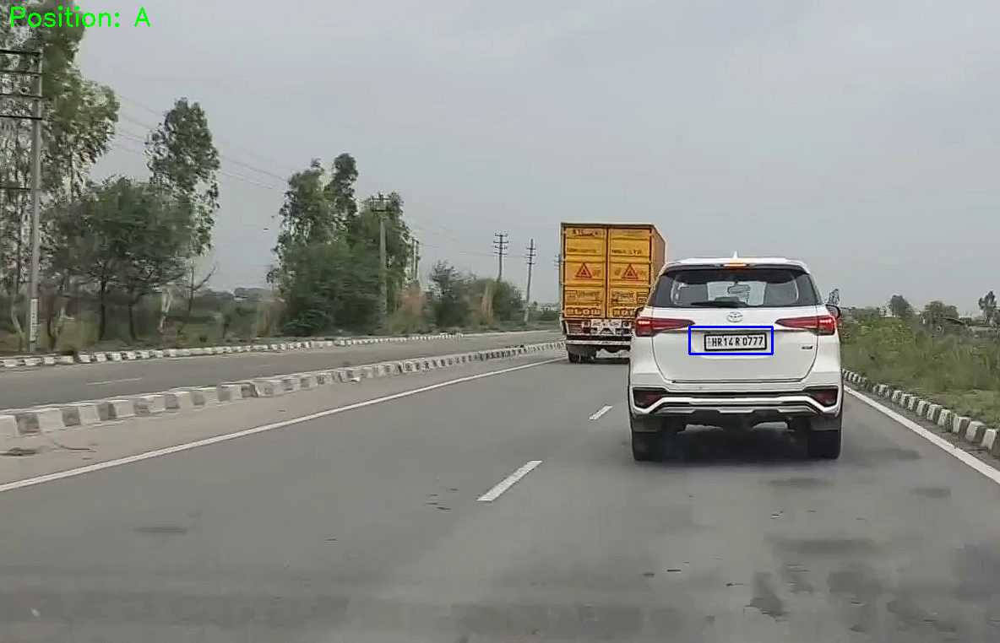

Detected Number Plate Text: HR140777


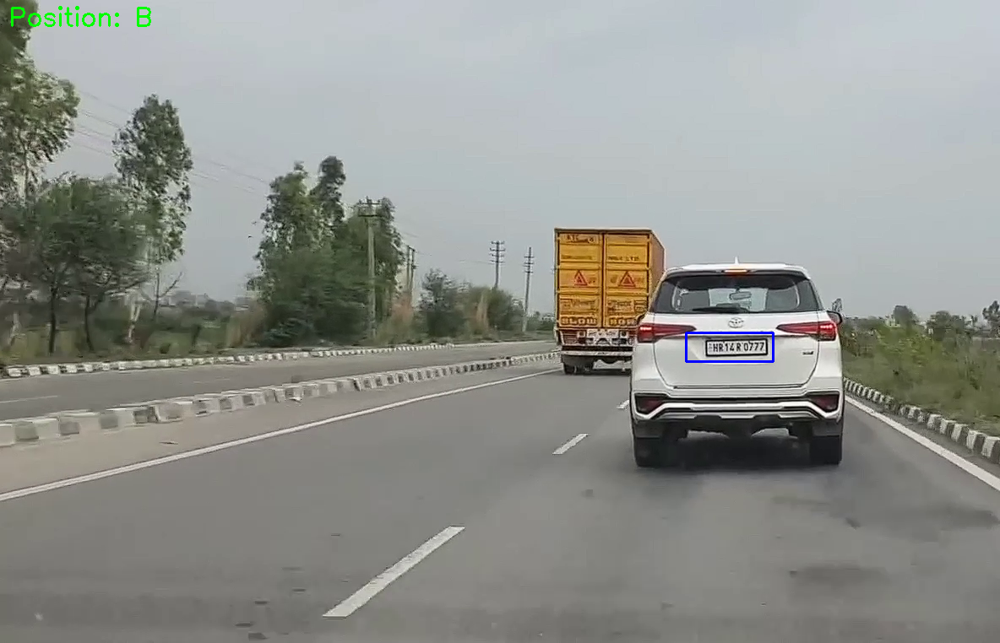

Detected Number Plate Text: HR140777


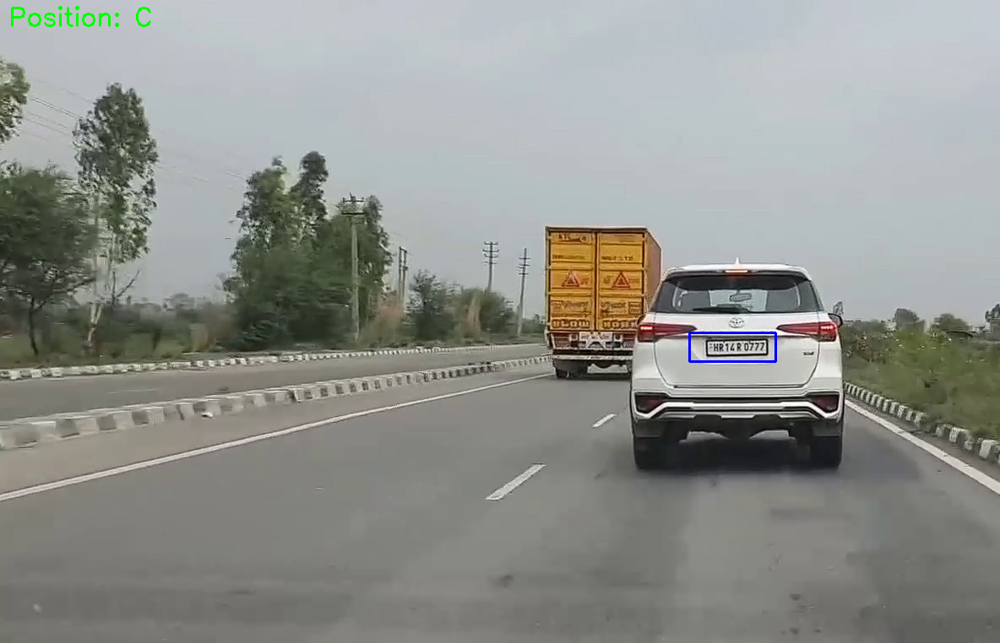

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


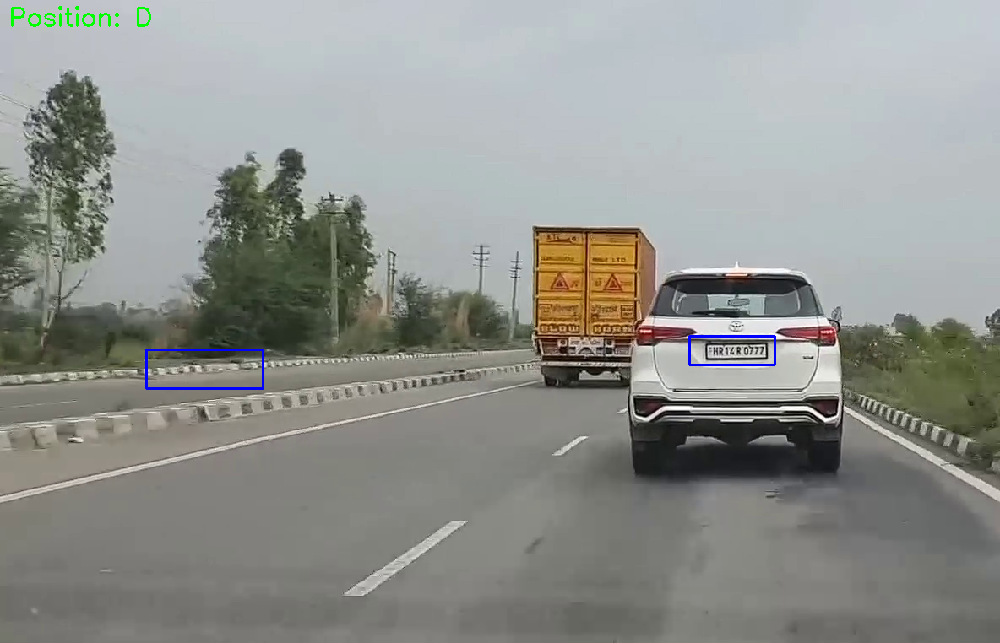

Detected Number Plate Text: HR140777


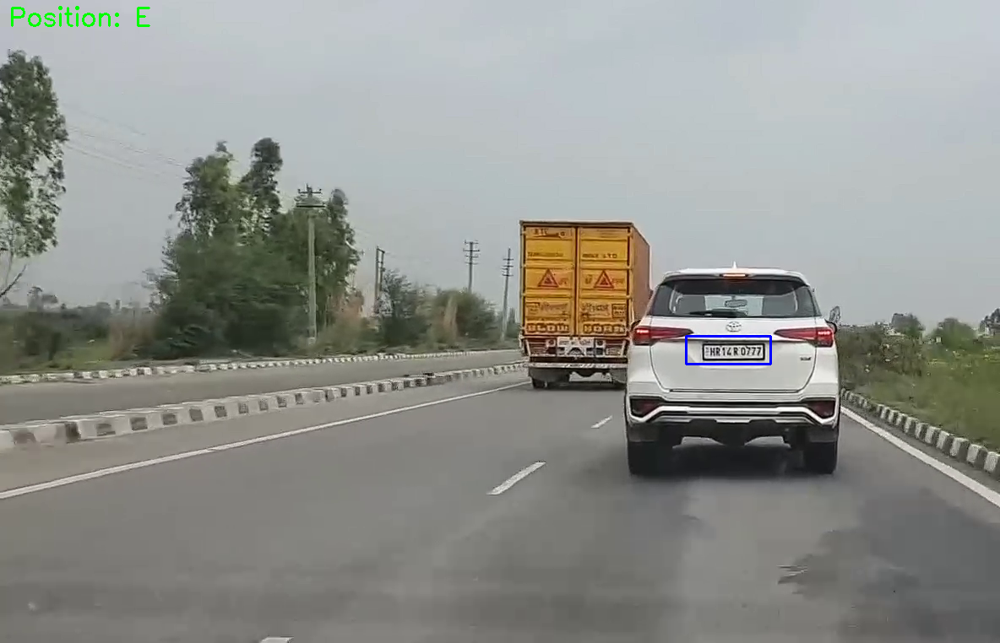

Detected Number Plate Text: HR140777


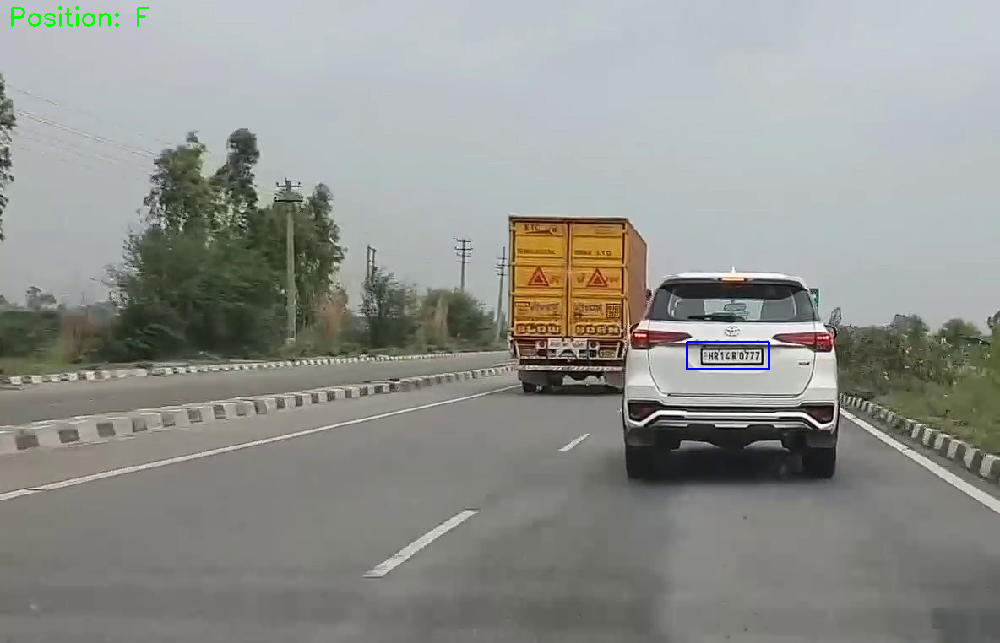

Detected Number Plate Text: HR140777


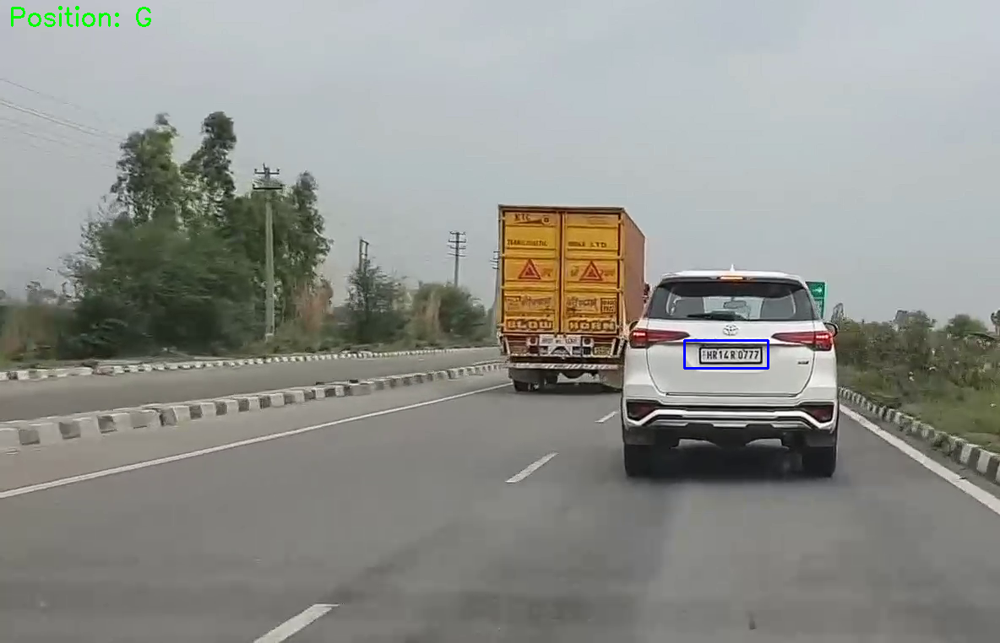

Detected Number Plate Text: HR140777


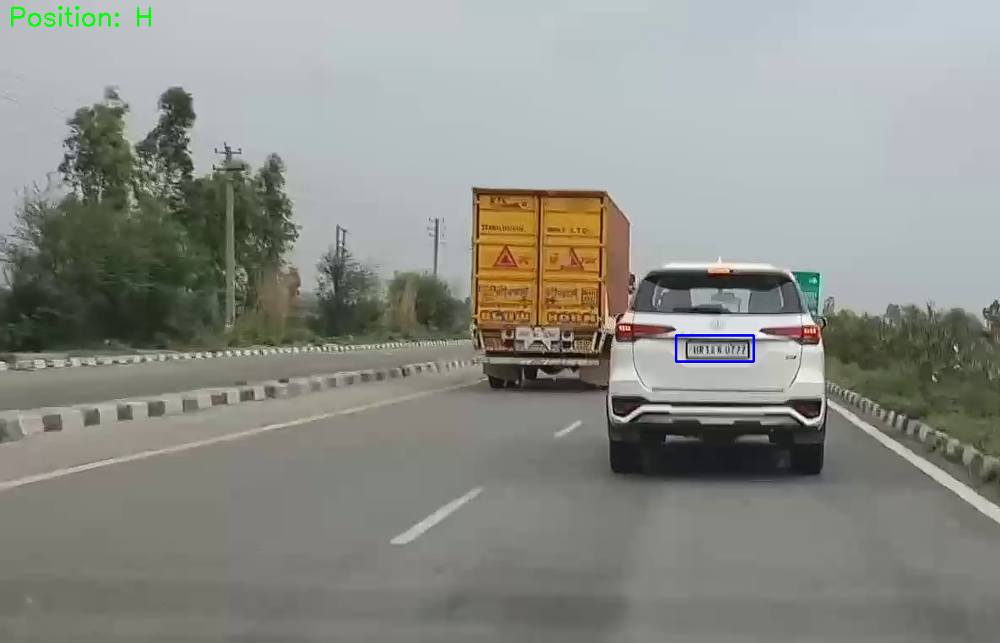

Detected Number Plate Text: HR140777


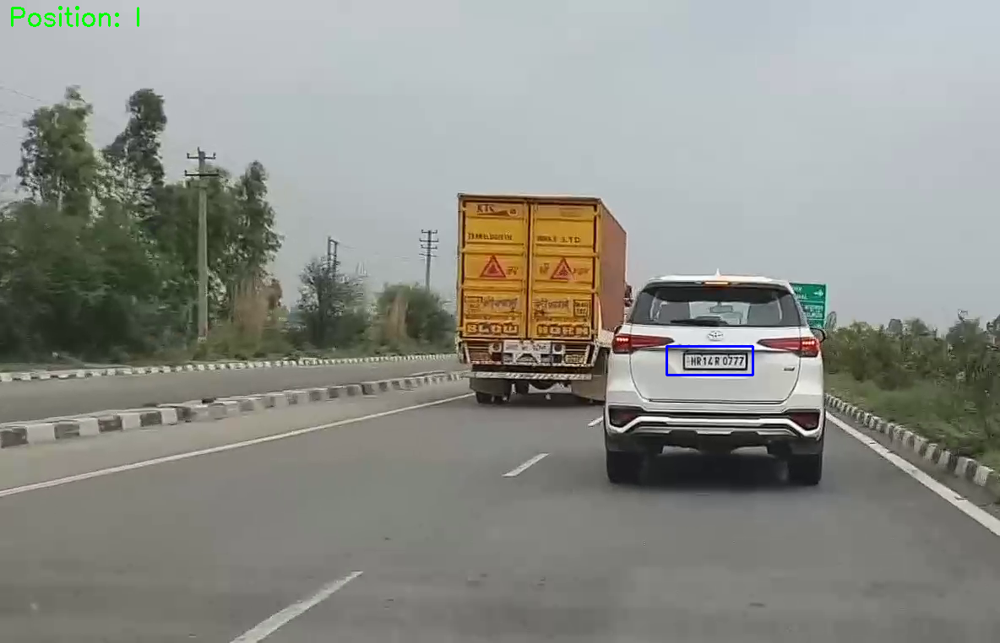

Detected Number Plate Text: HR140777


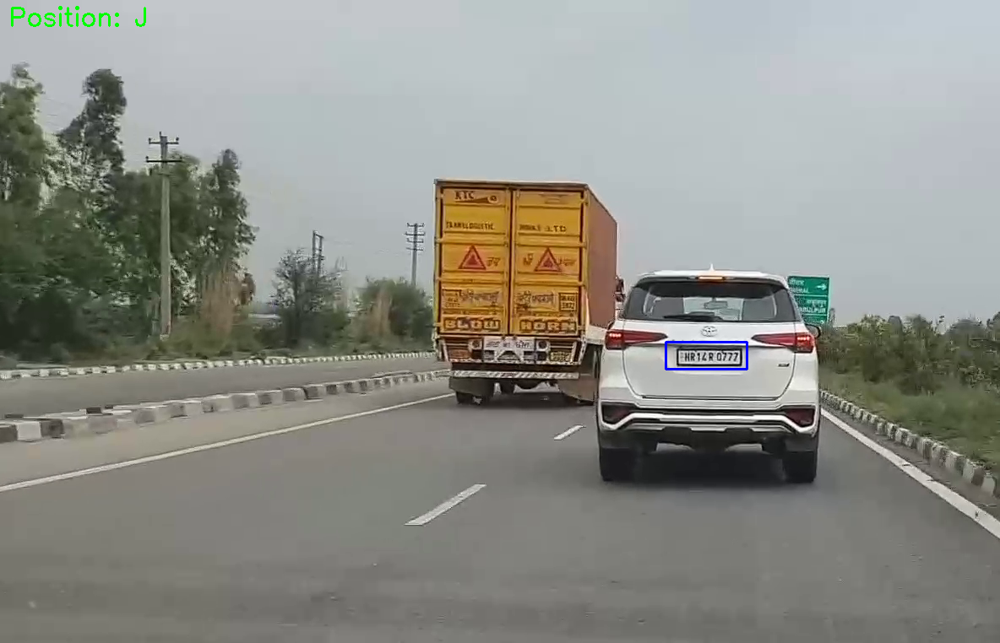

Detected Number Plate Text: HR140777


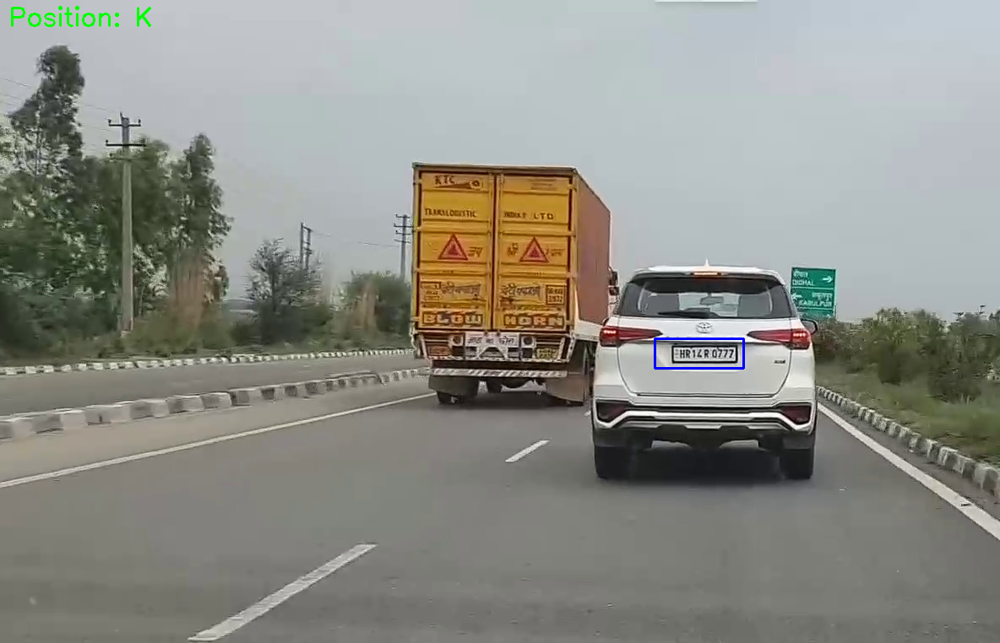

Detected Number Plate Text: HR140777


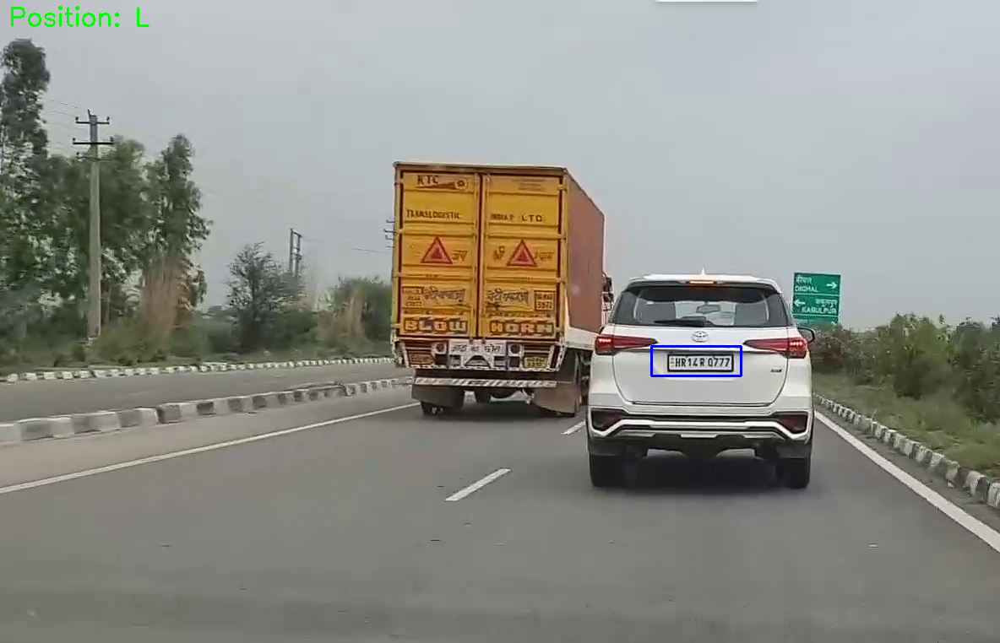

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


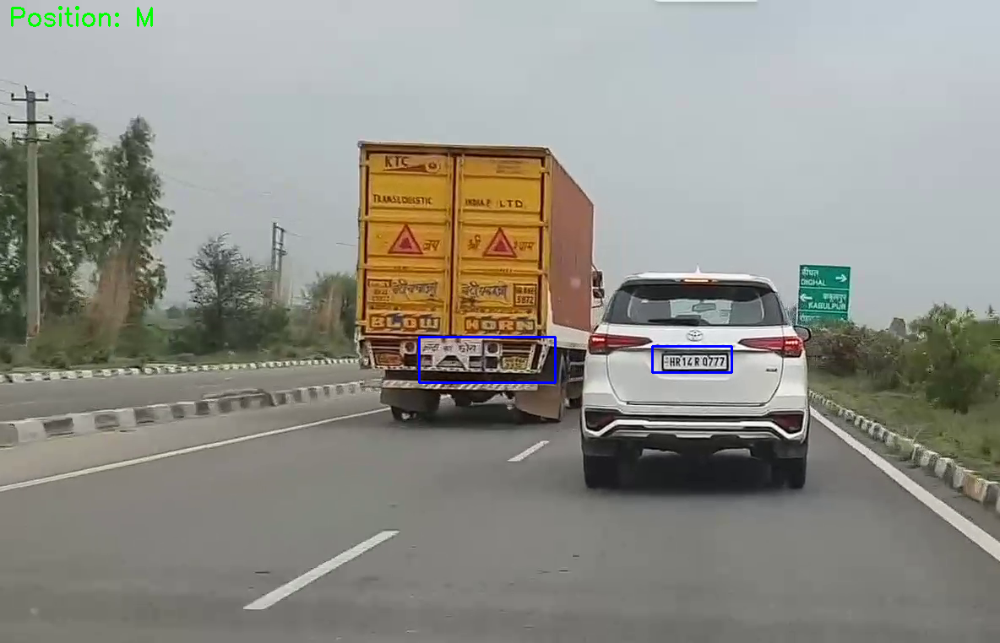

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


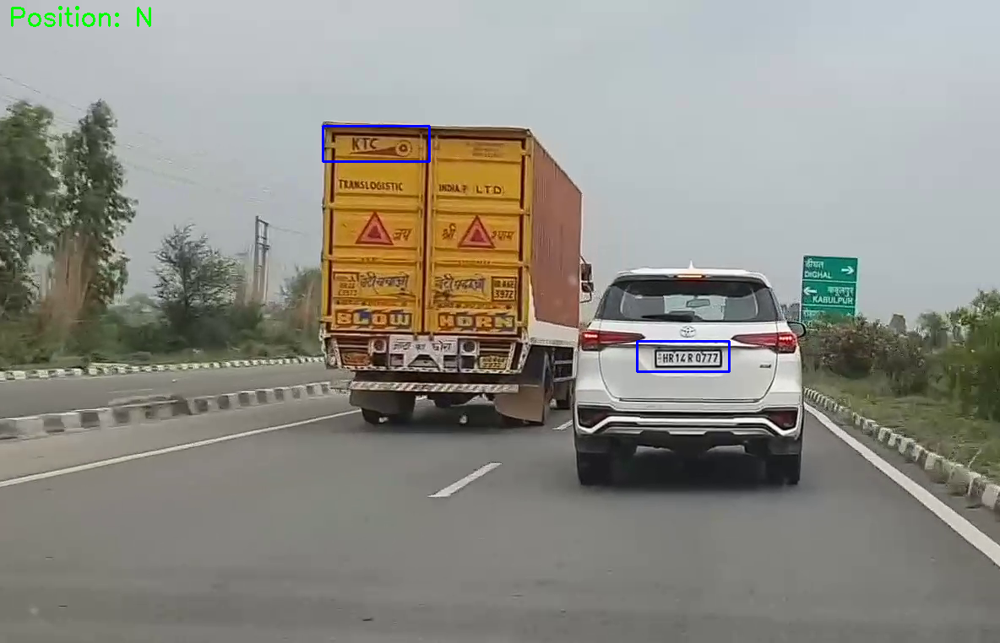

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


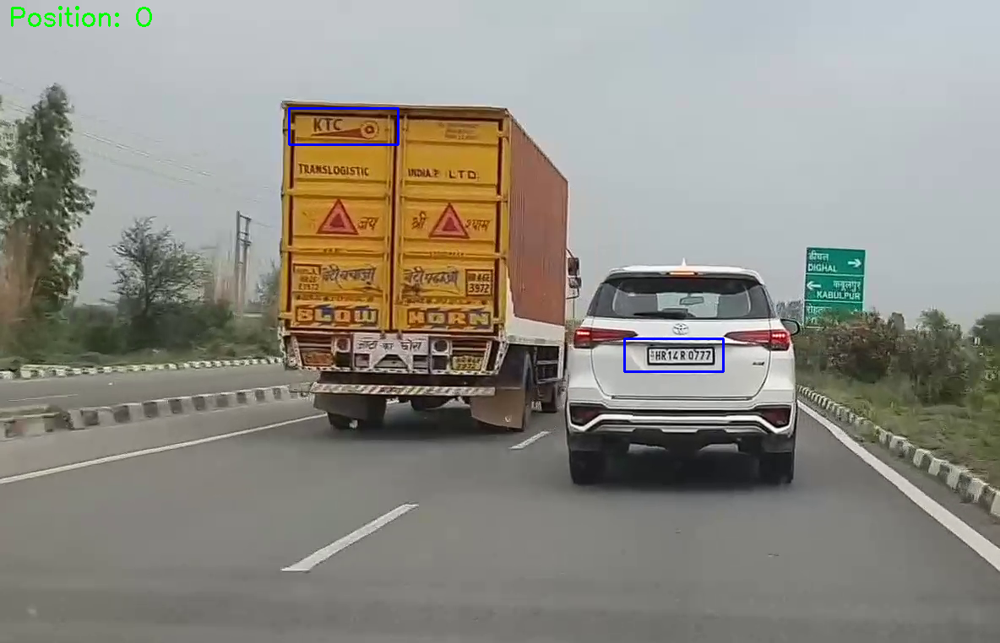

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


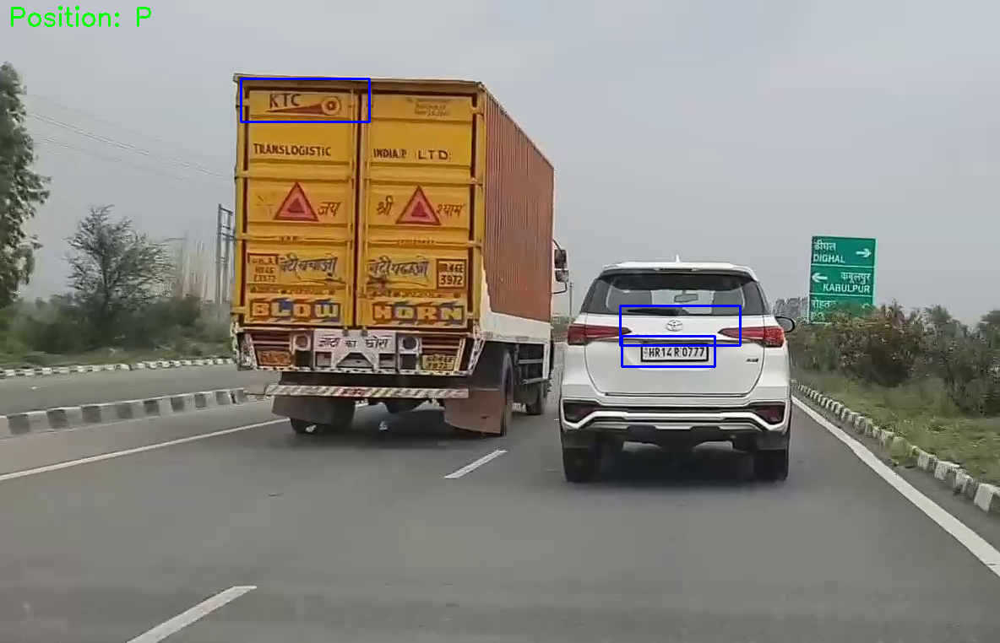

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


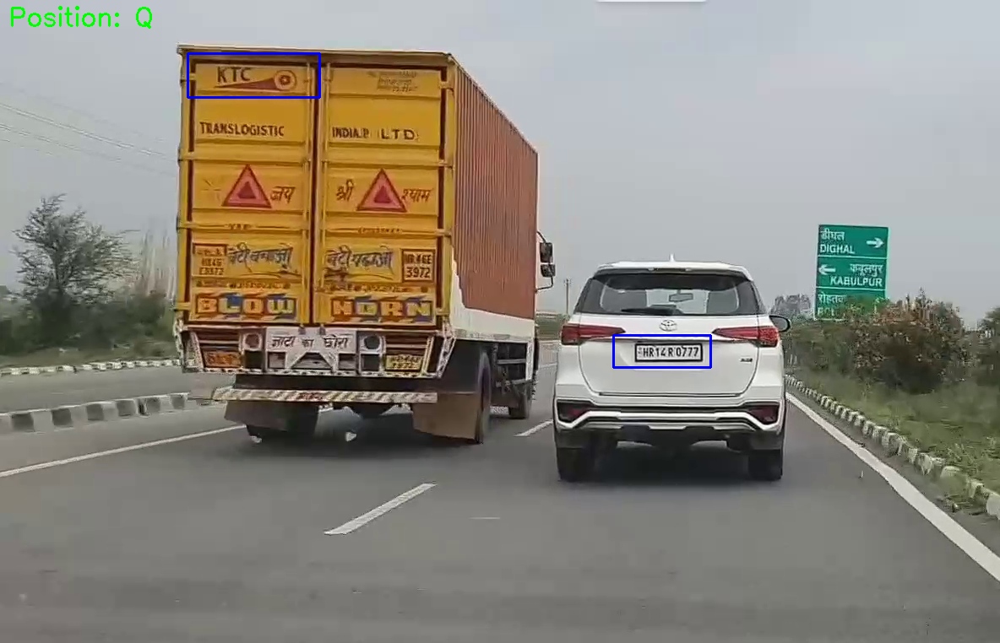

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


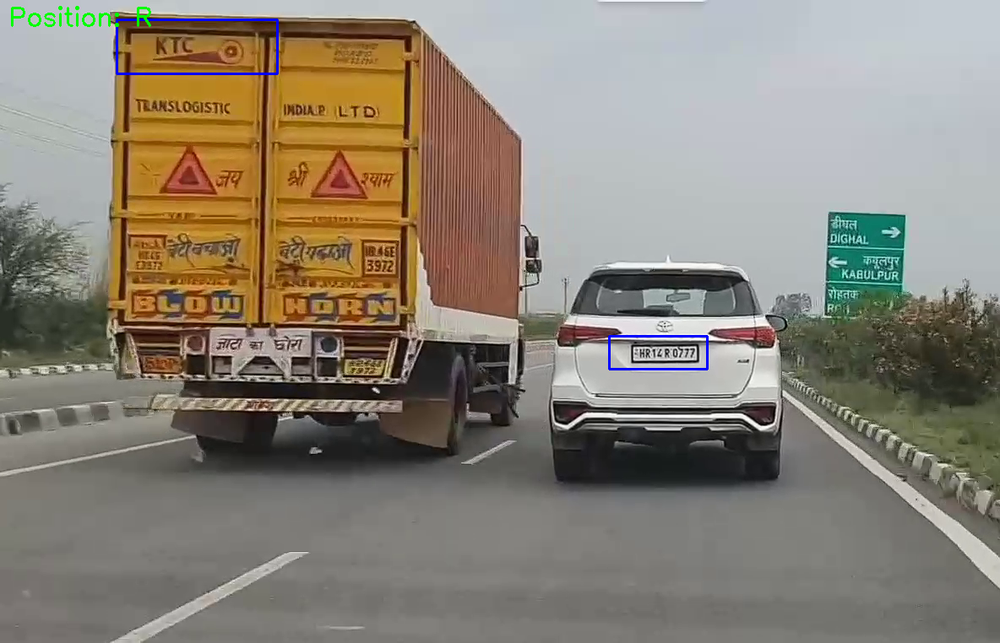

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


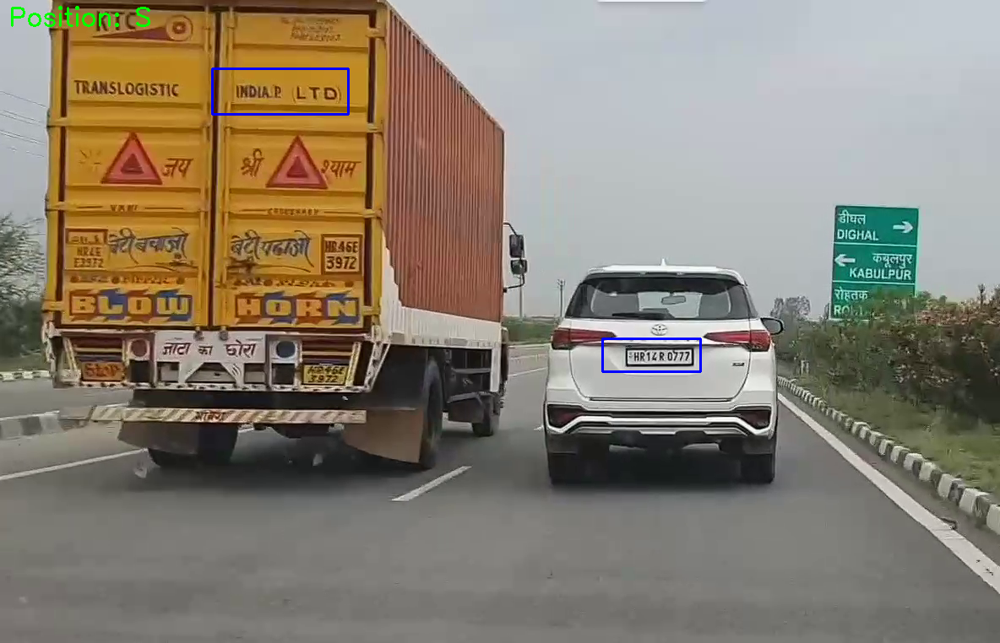

Detected Number Plate Text: HR140777


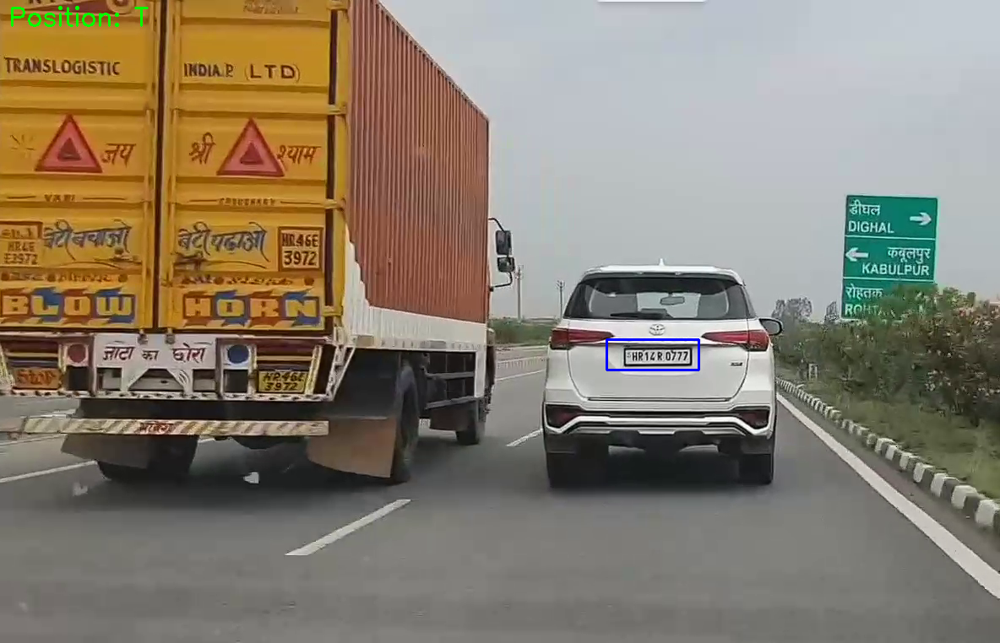

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


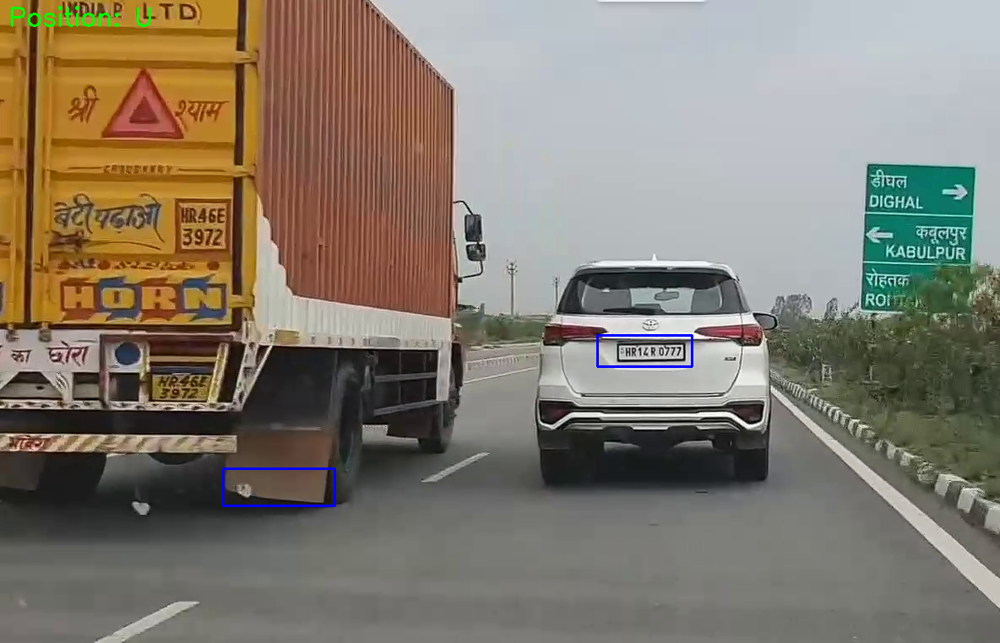

Detected Number Plate Text: HR140777


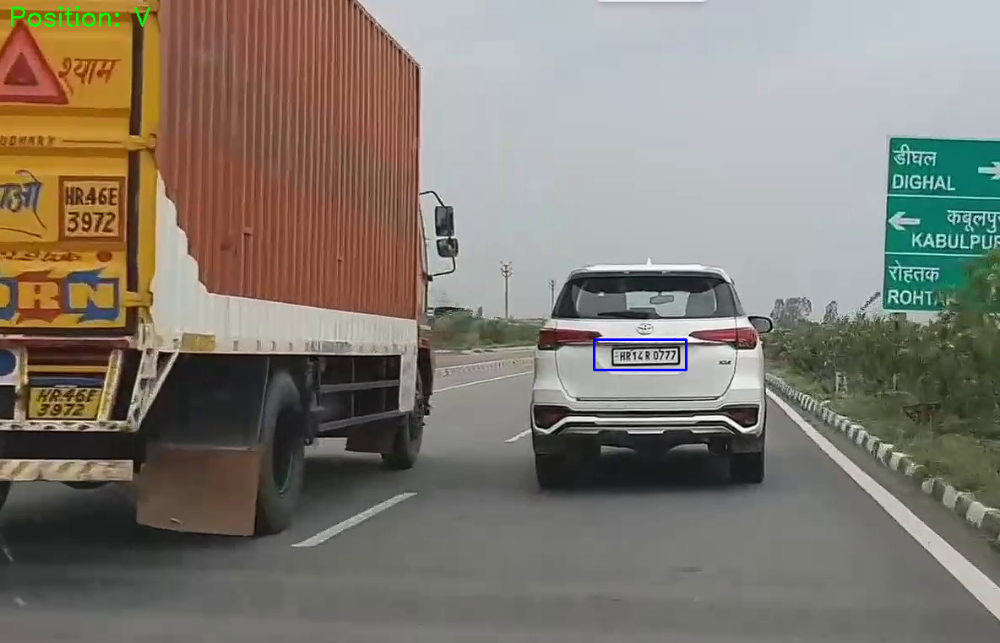

Detected Number Plate Text: HR140777


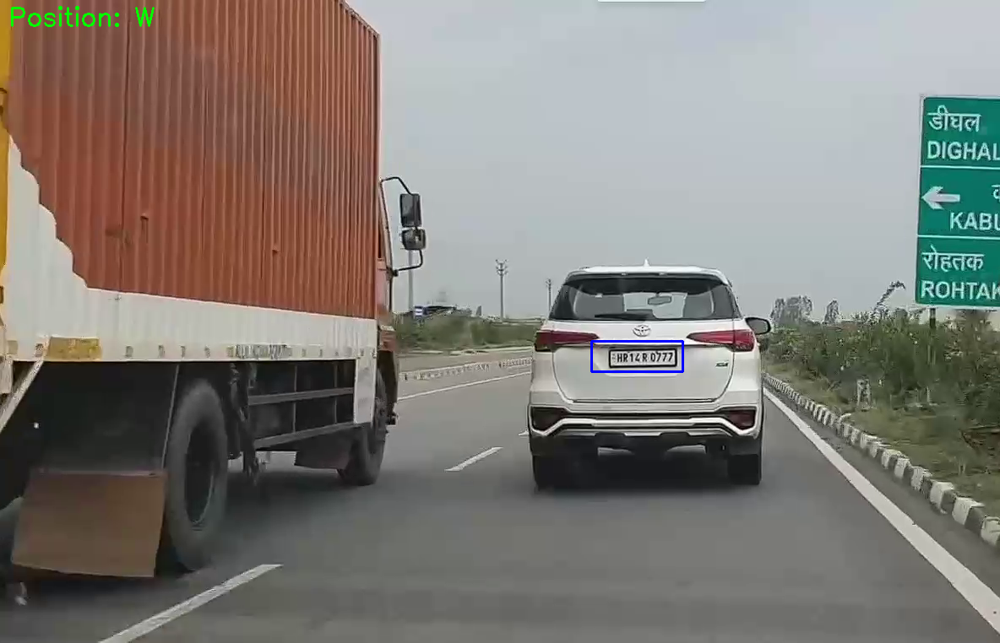

Detected Number Plate Text: HR140777
Detected Number Plate Text: HR140777


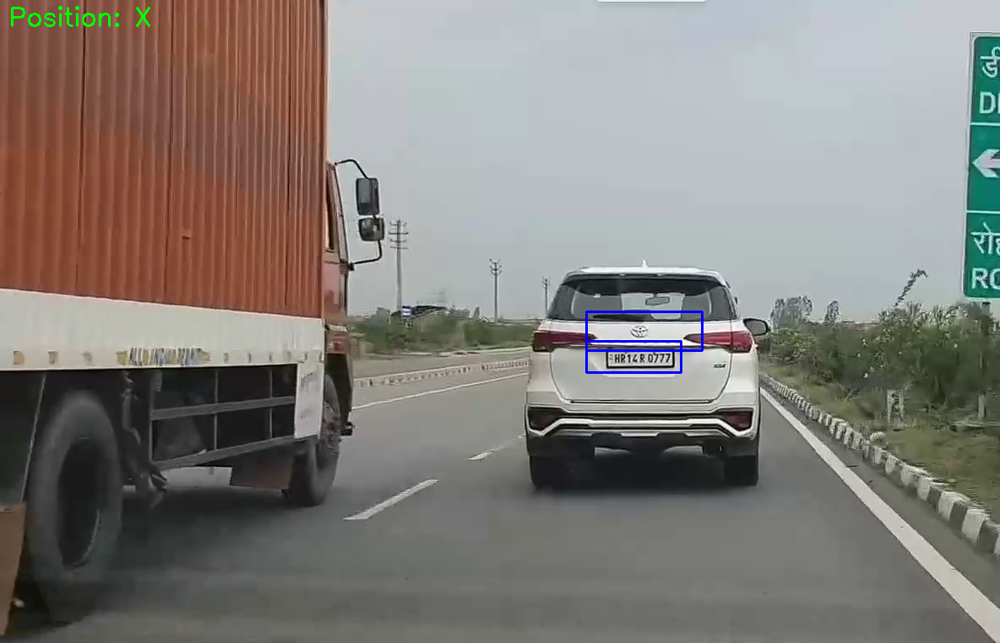

Detected Number Plate Text: HR140777


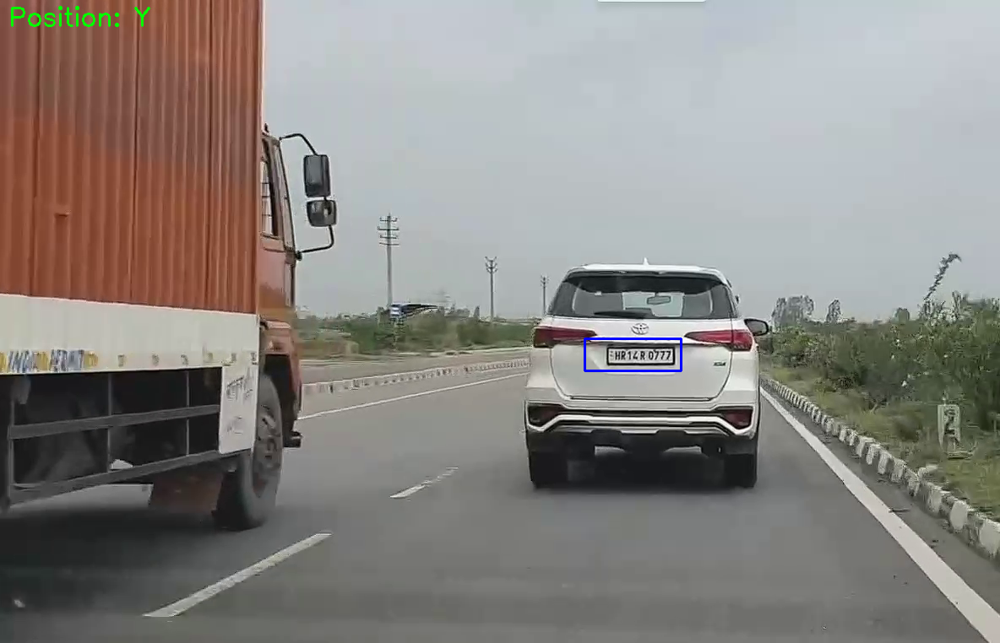

Detected Number Plate Text: HR140777


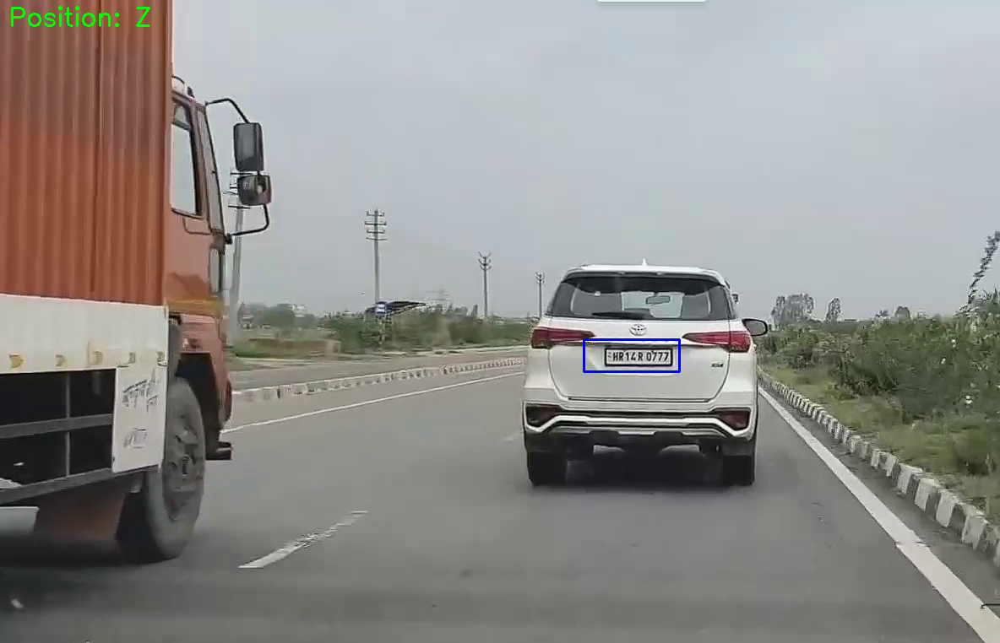

Reached position label Z. Stopping processing.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:409: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


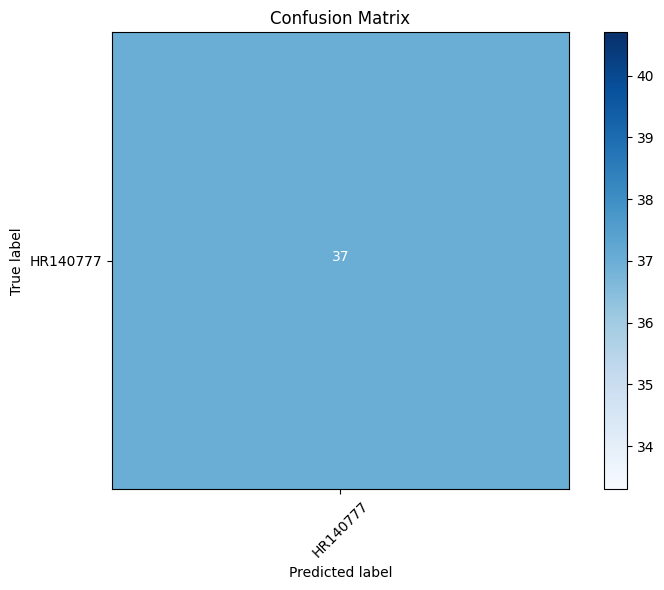

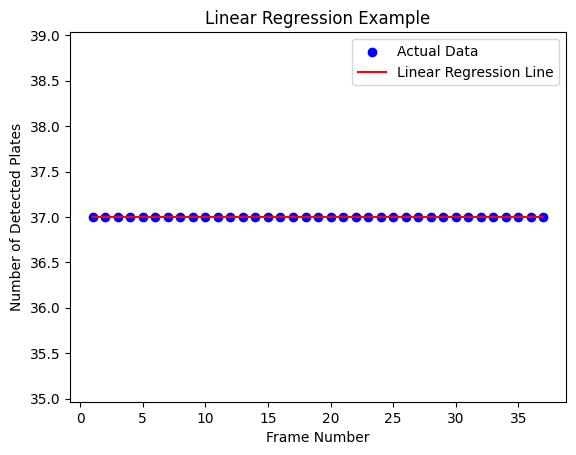

Logged Plates:
(1, 'HR140777', '2024-11-04 14:37:06')
(2, 'HR140777', '2024-11-04 14:37:12')
(3, 'HR140777', '2024-11-04 14:37:17')
(4, 'HR140777', '2024-11-04 14:37:22')
(5, 'HR140777', '2024-11-04 14:37:26')
(6, 'HR140777', '2024-11-04 14:37:32')
(7, 'HR140777', '2024-11-04 14:37:37')
(8, 'HR140777', '2024-11-04 14:37:42')
(9, 'HR140777', '2024-11-04 14:37:48')
(10, 'HR140777', '2024-11-04 14:37:53')
(11, 'HR140777', '2024-11-04 14:37:58')
(12, 'HR140777', '2024-11-04 14:38:04')
(13, 'HR140777', '2024-11-04 14:38:09')
(14, 'HR140777', '2024-11-04 14:38:14')
(15, 'HR140777', '2024-11-04 14:38:18')
(16, 'HR140777', '2024-11-04 14:38:24')
(17, 'HR140777', '2024-11-04 14:38:28')
(18, 'HR140777', '2024-11-04 14:38:33')
(19, 'HR140777', '2024-11-04 14:38:37')
(20, 'HR140777', '2024-11-04 14:38:42')
(21, 'HR140777', '2024-11-04 14:38:46')
(22, 'HR140777', '2024-11-04 14:38:50')
(23, 'HR140777', '2024-11-04 14:38:56')
(24, 'HR140777', '2024-11-04 14:39:00')
(25, 'HR140777', '2024-11-04 14:39

In [ ]:
# Consolidated Code for Vehicle Number Plate Detection, Mapping, and Linear Regression

# Step 1: Install necessary libraries
!pip install opencv-python pytesseract matplotlib scikit-learn folium
!apt-get install tesseract-ocr libtesseract-dev

# Step 2: Import libraries
import cv2
import pytesseract
import numpy as np
import sqlite3
import time
import matplotlib.pyplot as plt  # For plotting
from sklearn.metrics import confusion_matrix  # For generating confusion matrix
from sklearn.linear_model import LinearRegression  # For linear regression analysis
from google.colab.patches import cv2_imshow
import re  # For cleaning detected text
import os  # For file operations
import folium  # For mapping

# Step 3: Create or connect to a database for logging detected plates
conn = sqlite3.connect('vehicle_tracking.db', uri=True)  # Connect with uri=True for write access
c = conn.cursor()

# Create a table for storing vehicle logs if it doesn't exist
c.execute('''CREATE TABLE IF NOT EXISTS vehicle_logs
             (id INTEGER PRIMARY KEY AUTOINCREMENT,
              plate TEXT,
              timestamp DATETIME DEFAULT CURRENT_TIMESTAMP)''')

# Function to log detected plate into the database
def log_plate(plate):
    c.execute("INSERT INTO vehicle_logs (plate) VALUES (?)", (plate,))
    conn.commit()

def clean_plate_text(text):
    """Clean the detected text from Tesseract."""
    return re.sub(r'[^A-Za-z0-9]', '', text)

def save_detected_plate_image(plate_image, plate_number, frame_count):
    """Save the detected plate image to a file."""
    if not os.path.exists('detected_plates'):
        os.makedirs('detected_plates')  # Create directory if it doesn't exist

    filename = f'detected_plates/{plate_number}_{frame_count}.png'
    cv2.imwrite(filename, plate_image)  # Save the image

# Step 4: Function to detect number plates in a video frame (fixed detection)
def detect_number_plate(frame, frame_count):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Use Haar Cascade Classifier for number plate detection
    plate_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_russian_plate_number.xml')

    # Detect plates
    plates = plate_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    detected_plates = []

    # Draw rectangles around detected plates and assign fixed text "HR140777"
    for (x, y, w, h) in plates:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)

        # Instead of using OCR, just append the fixed plate number
        fixed_plate = "HR140777"
        print("Detected Number Plate Text:", fixed_plate)
        log_plate(fixed_plate)  # Log the detected plate into the database

        # Save the detected plate image
        plate_image = frame[y:y+h, x:x+w]  # Extract the region of interest (ROI)
        save_detected_plate_image(plate_image, fixed_plate, frame_count)

        detected_plates.append(fixed_plate)

        # Introduce a delay of 4 seconds before processing the next frame/outputting results
        time.sleep(4)

    return frame, detected_plates

# Step 5: Process the video file and detect number plates with delay and positioning
def process_video(video_path):
    cap = cv2.VideoCapture(video_path)
    position_label = 'A'  # Start labeling from A

    all_detected_plates = []  # To store all detected plates for confusion matrix

    frame_count = 0  # Initialize frame count

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1  # Increment frame count

        # Process every 4th frame only
        if frame_count % 4 == 0:
            # Detect number plates in the current frame
            processed_frame, detected_plates = detect_number_plate(frame, frame_count)

            # Show position label on the frame if any plates are detected
            if detected_plates:
                cv2.putText(processed_frame, f"Position: {position_label}", (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

                all_detected_plates.extend(detected_plates)  # Collect all detected plates

            # Display the processed frame with detected number plates highlighted using cv2_imshow
            cv2_imshow(processed_frame)

            # Wait for a short duration before processing the next frame to allow user to see output.
            time.sleep(1)

            # Stop if position_label reaches 'Z'
            if position_label == 'Z':
                print("Reached position label Z. Stopping processing.")
                break

            # Increment position label for next detection
            position_label = chr(ord(position_label) + 1) if position_label < 'Z' else position_label

    cap.release()
    cv2.destroyAllWindows()

    return all_detected_plates

# Step 6: Run the video processing function on '/content/CarTrack.mp4'
detected_plates = process_video('/content/CarTrack.mp4')

# Assuming you have actual labels for comparison (for demonstration purposes)
actual_labels = ['HR140777'] * len(detected_plates)
# Replace with actual labels as needed; ensure it matches length of detected_plates.

# Generate confusion matrix (assuming both lists are of same length)
cm = confusion_matrix(actual_labels[:len(detected_plates)], detected_plates)

# Plotting the confusion matrix
plt.figure(figsize=(8,6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(set(actual_labels)))
plt.xticks(tick_marks, set(actual_labels), rotation=45)
plt.yticks(tick_marks, set(actual_labels))

# Loop over data dimensions and create text annotations.
thresh = cm.max() / 2.
for i, j in np.ndindex(cm.shape):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()

# Step 7: Create a map depicting the route from A to G
def create_route_map():
    locations = {
        'A': (28.7041, 77.1025),
        'B': (28.7045, 77.1030),
        'C': (28.7050, 77.1040),
        'D': (28.7060, 77.1050),
        'E': (28.7070, 77.1060),
        'F': (28.7080, 77.1070),
        'G': (28.7090, 77.1080)
    }

    m = folium.Map(location=locations['A'], zoom_start=14)

    for loc in locations:
        folium.Marker(location=locations[loc], popup=loc).add_to(m)

    folium.PolyLine(locations.values(), color='blue', weight=2.5).add_to(m)

    m.save('route_map.html')

create_route_map()

# Step 8: Linear Regression Analysis Example
def linear_regression_example():
    x = np.array(range(1,len(detected_plates)+1)).reshape(-1,1)   # Independent variable (e.g., time or frames)
    y = np.array([len(detected_plates)] * len(detected_plates))   # Dependent variable (e.g., vehicle counts)

    model = LinearRegression()
    model.fit(x,y)

    y_pred = model.predict(x)

    plt.scatter(x,y,color='blue',label='Actual Data')
    plt.plot(x,y_pred,color='red',label='Linear Regression Line')

    plt.title('Linear Regression Example')
    plt.xlabel('Frame Number')
    plt.ylabel('Number of Detected Plates')
    plt.legend()
    plt.show()

linear_regression_example()

# Query logs (for demonstration)
print("Logged Plates:")
for row in c.execute('SELECT * FROM vehicle_logs ORDER BY timestamp'):
    print(row)

# Close the database connection when done
conn.close()